# Closed loop stimulation using TVB
Adapted from Dan's code. 

In [1]:
%pylab nbagg
from tvb.simulator.lab import *

Populating the interactive namespace from numpy and matplotlib
   INFO  log level set to INFO


#Epileptor Model

Set up the Epileptor model with default parameters from the tutorial. 

Sets up regions 69,72 as epileptogenic and 62,47,40 as epileptic.

In [2]:
epileptors = models.Epileptor(Ks=-0.2, Kf=0.1, r=0.00015)
epileptors.x0 = np.ones((76))*-2.4 #set all brain regions non-epileptic
#epileptors.x0[[69, 72]] = np.ones((2))*-1.8 #overwrite as epileptogenic; borderline epileptic ('close to epilepsy threshold')
epileptors.x0[[9, 47]] = np.ones((3))*-1.6 #rHC and lHC are epileptic

Set parameters for the Epileptor model. Use Heun integration, difference coupling and the default settings for connectivity. Additive noise. All of these parameters can be found in the Epileptor tutorial

In [3]:
con = connectivity.Connectivity(load_default=True)
coupl = coupling.Difference(a=1.)
heunint = integrators.HeunDeterministic(dt=0.05)

WARNING  File 'hemispheres' not found in ZIP.


#Monitors
Use and SEEG and EEG monitor. Currently, only the EEG monitor is analyzed. The pre_expression seems doesn't seem to exist in TVB anymore - I think it has been removed. 

In [67]:
# load the default region mapping
rm = region_mapping.RegionMapping(load_default=True)

pre_expr = "-y0+y3" #5 abstract state variables (plus one that is implicitly defined), this combination was found to correspond to EEG signals

#Initialise some Monitors with period in physical time
mon_tavg = monitors.TemporalAverage(period=1.)
mon_SEEG = monitors.iEEG(load_default=True,
                         region_mapping=rm,
                         period=1.,
                         ) #intracranial EEG (iEEG) is a particular/specific type of stereoEEG (SEEG)

#Bundle them
what_to_watch = (mon_tavg, mon_SEEG)

Simulation length and frequency are set up so that SIM_LEN/INTERACTIVE_FREQ discrete simulations are done

In [68]:
pulse_length = 300 #ms
SIM_LEN = 5000 #ms
FREQ = 0.1 #kHZ, stimulation frequency

#Stimulation
Stimulus is set up the same way the stimulus tutorial shows. The two epileptic regions (69, 72) are configured as the targets of stimulation.

<IPython.core.display.Javascript object>


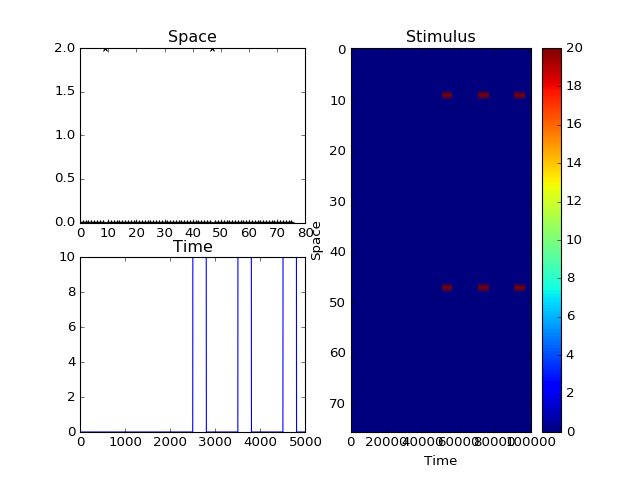

In [69]:
weighting = np.ones((76))*0 #numpy.zeros((76))
weighting[[9, 47]] = numpy.array([2.0]) #stimulate rHC and lHC
#weighting[[69, 72]] = numpy.array([2.0]) #stimulus amplification

#this is our stimulus, simple pulse whose amplitude/value can be changed each differential instant
eqn_t = equations.PulseTrain()               #square wave
eqn_t.parameters["T"] = 1000      #period of a pulse
eqn_t.parameters["onset"] = SIM_LEN/2
eqn_t.parameters["tau"] = pulse_length #N #1/(2*FREQ)
eqn_t.parameters["amp"] = 10
stim = patterns.StimuliRegion(temporal = eqn_t,
                              connectivity = con, 
                              weight = weighting)
#Configure space and time
stim.configure_space()
stim.configure_time(numpy.arange(0., SIM_LEN, heunint.dt))
plot_pattern(stim)

Configure simulator

In [70]:
#Initialise a Simulator -- Model, Connectivity, Integrator, and Monitors.
sim = simulator.Simulator(model = epileptors, 
                          connectivity = con,
                          coupling = coupl, 
                          integrator = heunint, 
                          monitors = what_to_watch,
                          stimulus = stim)
sim.configure()

initial_conditions,None
coupling,Difference(a=1)
stimulus,"StimuliRegion(bound=False, value=None)"
integrator,HeunDeterministic(dt=0.05)
surface,None
connectivity,"Connectivity(bound=False, value=None)"
conduction_speed,3.0
simulation_length,1000.0
model,"Epileptor(bound=False, value=None)"
monitors,"(TemporalAverage(bound=False, value=None), iEEG(bound=False, value=None))"


#Simulate
This takes a while (>3 minutes for SIM_LEN > 2000)

In [71]:
(ttavg, tavg), (tseeg, seeg) = sim.run(simulation_length = SIM_LEN)

<IPython.core.display.Javascript object>


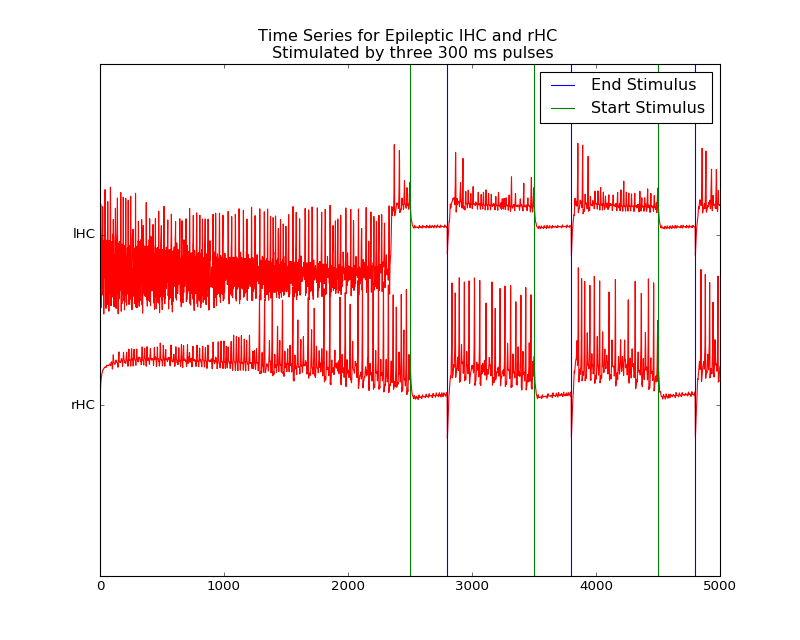

In [85]:


# Normalize the time series to have nice plots
tavg /= (np.max(tavg,0) - np.min(tavg,0 ))

#Plot raw time series
figure(figsize=(10,8))
#plot(ttavg[:], tavg[:, 0, :, 0] + np.r_[:76], 'r')
plot(ttavg[:], tavg[:, 0, [9,47], 0] + [1,2], 'r')
yticks([1,2], con.region_labels[[9,47]])
#Plot Lines at stimulus 
x1s = np.linspace(2500, 2500)
x2s = np.linspace(3500, 3500)
x3s = np.linspace(4500,4500)
x1e = np.linspace(2500 + pulse_length, 2500 + pulse_length)
x2e = np.linspace(3500 + pulse_length, 3500 + pulse_length)
x3e = np.linspace(4500 + pulse_length,4500 + pulse_length)
y = np.linspace(0,3)
plot(x1s,y, 'g')
plot(x2s,y, 'g')
plot(x3s,y, 'g')
plot(x1e,y, 'b')
plot(x2e,y, 'b')
plot(x3e,y, 'b')

red_line = Line2D([], [], color='green', label='Start Stimulus')
blue_line = Line2D([], [], color='blue', label='End Stimulus')
legend(handles=[blue_line, red_line])

title("Time Series for Epileptic lHC and rHC \n Stimulated by three " + str(pulse_length) + " ms pulses")

savefig('Graphs/' + str([47,9]) + '-plength' + str(pulse_length) +'.pdf')


<IPython.core.display.Javascript object>


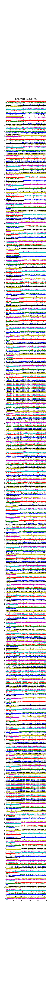

In [82]:
#Normalize SEEG data
seeg /= 5*(np.max(seeg,0) - np.min(seeg,0 ))
seeg -= np.mean(seeg, 0)

#SEEG has 588 traces
traces_displayed = 588
figure(figsize=(10,traces_displayed/3))
axis()

#Plot Lines at stimulus 
x1 = np.linspace(2500, 2500)
x2 = np.linspace(3500, 3500)
x3 = np.linspace(4500,4500)
y = np.linspace(0,traces_displayed*2)
plot(x1,y)
plot(x2,y)
plot(x3,y)

#Plot SEEG data
plot(tseeg[:], 10*seeg[:, 0, :traces_displayed, 0] + 2*np.r_[:traces_displayed])
yticks(2*np.r_[:traces_displayed], mon_SEEG.sensors.labels[:traces_displayed])
ylim([-2,traces_displayed*2 +2])

title("Epileptor with rHC and lHC epileptic regions. \n Three 500 ms stimuli at rHC and lHC (plotted).")

#Loop
Here's a loop to save a bunch of images at the same time

In [5]:
%pylab nbagg
from tvb.simulator.lab import *

Populating the interactive namespace from numpy and matplotlib


In [6]:
epileptic = [9,47]
almost_epileptic = [2,40]
#pulses = [1, 10]
pulse_length = 1
amps = [0.7, 0.8, 0.9, 1]
SIM_LEN = 10000 #ms
amplification = 10 #up to 20

In [7]:


epileptors = models.Epileptor(Ks=-0.2, Kf=0.1, r=0.00015)
epileptors.x0 = np.ones((76))*-2.4 #set all brain regions non-epileptic
epileptors.x0[almost_epileptic] = np.ones((2))*-1.9 #overwrite as epileptogenic; borderline epileptic ('close to epilepsy threshold')
epileptors.x0[epileptic] = np.ones((3))*-1.6 #rHC and lHC are epileptic

#stuff
con = connectivity.Connectivity(load_default=True)
coupl = coupling.Difference(a=1.)
heunint = integrators.HeunDeterministic(dt=0.05)

# load the default region mapping
rm = region_mapping.RegionMapping(load_default=True)

pre_expr = "-y0+y3" #5 abstract state variables (plus one that is implicitly defined), this combination was found to correspond to EEG signals

#Initialise some Monitors with period in physical time
mon_tavg = monitors.TemporalAverage(period=1.)
mon_SEEG = monitors.iEEG(load_default=True,
                         region_mapping=rm,
                         period=1.,
                         ) #intracranial EEG (iEEG) is a particular/specific type of stereoEEG (SEEG)

#Bundle them
what_to_watch = (mon_tavg, mon_SEEG)

WARNING  File 'hemispheres' not found in ZIP.


Loop through the pulses given

In [8]:
for amp in amps:
    for i in [1]:
    
        #set stimulus to epileptic regions
        weighting = np.ones((76))*0 #numpy.zeros((76))
        weighting[epileptic] = numpy.array([2.0]) #stimulate rHC and lHC
        #weighting[[69, 72]] = numpy.array([2.0]) #stimulus amplification

        #this is our stimulus, simple pulse whose amplitude/value can be changed each differential instant
        eqn_t = equations.PulseTrain()               #square wave
        eqn_t.parameters["T"] = 1500      #period of a pulse
        eqn_t.parameters["onset"] = SIM_LEN/2
        eqn_t.parameters["tau"] = pulse_length #N #1/(2*FREQ)
        eqn_t.parameters["amp"] = amp
        stim = patterns.StimuliRegion(temporal = eqn_t,
                                  connectivity = con, 
                                  weight = weighting)
        #Configure space and time
        stim.configure_space()
        stim.configure_time(numpy.arange(0., SIM_LEN, heunint.dt))
        #plot_pattern(stim)

        #Initialise a Simulator -- Model, Connectivity, Integrator, and Monitors.
        sim = simulator.Simulator(model = epileptors, 
                              connectivity = con,
                              coupling = coupl, 
                              integrator = heunint, 
                              monitors = what_to_watch,
                              stimulus = stim)
        sim.configure()

        #simulate
        (ttavg, tavg), (tseeg, seeg) = sim.run(simulation_length = SIM_LEN)


        # Normalize the time series to have nice plots
        tavg /= (np.max(tavg,0) - np.min(tavg,0 ))
        ioff()
        #Plot raw time series
        figure(figsize=(10,12))
        #plot(ttavg[:], tavg[:, 0, :, 0] + np.r_[:76], 'r')
        plot(ttavg[:], tavg[:, 0, [9,47,2,40,0,38], 0] + [1,2,3,4,5,6], 'r')
        yticks([1,2,3,4,5,6], con.region_labels[[9,47,2,40,0,38]])
        #Plot Lines at stimulus 
        #x1s = np.linspace(3000, 3000)
        #x2s = np.linspace(3500, 3500)
        #x3s = np.linspace(4000,4000)
        #x4s = np.linspace(4500, 4500)
        x5s = np.linspace(5000, 5000)
        #x6s = np.linspace(5500,5500)
        #x7s = np.linspace(6000,6000)
        x8s = np.linspace(6500,6500)
        #x9s = np.linspace(7000,7000)
        #x10s = np.linspace(7500,7500)
        x11s = np.linspace(8000,8000)
        #x12s = np.linspace(8500,8500)
        #x13s = np.linspace(9000,9000)
        x14s = np.linspace(9500,9500)
        
        
        
        #x1e = np.linspace(3000 + pulse_length, 3000 + pulse_length)
        #x2e = np.linspace(3500 + pulse_length, 3500 + pulse_length)
        #x3e = np.linspace(4000 + pulse_length,4000 + pulse_length)
        #x4e = np.linspace(4500 + pulse_length, 4500 + pulse_length)
        x5e = np.linspace(5000 + pulse_length, 5000 + pulse_length)
        #x6e = np.linspace(5500 + pulse_length,5500 + pulse_length)
        #x7e = np.linspace(6000 + pulse_length,6000 + pulse_length)
        x8e = np.linspace(6500 + pulse_length,6500 + pulse_length)
        #x9e = np.linspace(7000 + pulse_length,7000 + pulse_length)
        #x10e = np.linspace(7500 + pulse_length,7500 + pulse_length)
        x11e = np.linspace(8000 + pulse_length,8000 + pulse_length)
        #x12e = np.linspace(8500 + pulse_length,8500 + pulse_length)
        #x13e = np.linspace(9000 + pulse_length,9000 + pulse_length)
        x14e = np.linspace(9500 + pulse_length,9500 + pulse_length)
        
        
        
        
        y = np.linspace(0,8)
       
        plot(x5s,y, 'g')
        plot(x8s,y, 'g')
        plot(x11s,y, 'g')
        plot(x14s,y, 'g')
        
        plot(x5e,y, 'b')
        plot(x8e,y, 'b')
        plot(x11e,y, 'b') 
        plot(x14e,y, 'b')
        
        red_line = Line2D([], [], color='green', label='Start Stimulus')
        blue_line = Line2D([], [], color='blue', label='End Stimulus')
        legend(handles=[blue_line, red_line])

        title("Time Series for Epileptic lHC and rHC, Borderline rAMYG and lAMYG \n Stimulated by 6 " + str(amp) + " amp pulses, T"+str(i))

        savefig('Graphs/' + str(epileptic) + '-amp' + str(amp)+'T'+str(i) +'.pdf')
        outfile = open('Graphs/' + str(epileptic) + '-amp' + str(amp) +'T'+str(i)+ '.txt', "w")
        for time, value in zip(ttavg, tavg):
                outfile.write(str(time) + ' \t')
                for sensor in value[0]:
                    outfile.write(str(sensor[0]) + '\t')
                outfile.write('\n')
        outfile.close()

IOError: [Errno 13] Permission denied: 'Graphs/[9, 47]-amp1T1.pdf'